In [1]:
import librosa.display
import pandas as pd
import scipy.io.wavfile

from utils.signal import get_segment, plot_signal, plot_spectra, stft_audio,calc_mfcc, get_segment_stats, envelope, get_total_segment_stats, get_total_audio_stats
from utils.annotation import get_meta_annotation, get_simplified_meta_annotation, get_simplified_annotation
import IPython.display as ipd
from utils.randomforest import run_randomforest
from utils.features import get_boxplot_by_species, get_scree_plot
import seaborn as sns
from hidden_Markov_Model import *
import matplotlib.pyplot as plt


# 1. 数据来源/数据格式

数据集来源于 Dryad.(2021)，包含鸟鸣音频(.wav 格式)与相应注解(.txt 文件)。 其中，每份音频文件时长为 5 分钟，总计 385 分钟，采样频率为 32kHz。音频数据收 集于 2018 年 4 月至 6 月，美国宾夕法尼亚州的 Powdermill 自然保护区。随后，研究 人员通过 Raven Pro 软件标注每份音频中的鸟鸣起讫时间(Begin Time (s)、End Time (s))、鸟鸣的频率范围(Low Freq (Hz)、High Freq (Hz))，以及相应的鸟类(species)，并 对最后结果进行人为复查。
由于鸟鸣分割经过专业软件与专家双重校验，因此本文将注释文件中的鸟鸣起始 时间当作真实值，开展后续的特征提取与分类工作。

以下代码在此基础上，增添了'duration', 'is_isolated','overlap_percent','recording'列。作用分别是：

- 'duration', 'is_isolated','overlap_percent'：计算音频重叠时长百分比。

- 'recording'：用于描述性统计


In [2]:
header_path = './dryad/annotation_Files/Recording_1/Recording_1_Segment_01.Table.1.selections.txt'
annotation_path = './dryad/annotation_Files'
bird_annotation = get_meta_annotation(header_path, annotation_path)
bird_annotation.head()

,selection,View,Channel,start,end,low_freq,high_freq,species,duration,is_isolate,overlap_percent,recording
0,1,Spectrogram 1,1,154.387793,154.911598,2878.2,4049.0,EATO,0.523805,True,-24.083369,Recording_1_Segment_02
1,2,Spectrogram 1,1,167.526598,168.173020,2731.9,3902.7,EATO,0.646422,True,-43.395194,Recording_1_Segment_02
2,3,Spectrogram 1,1,183.609637,184.097752,2878.2,3975.8,EATO,0.488115,True,-167.719477,Recording_1_Segment_02
3,4,Spectrogram 1,1,250.527481,251.160711,2756.2,3951.4,EATO,0.633230,True,-147.112858,Recording_1_Segment_02
4,5,Spectrogram 1,1,277.887243,278.480896,2707.5,3975.8,EATO,0.593653,True,-73.738937,Recording_1_Segment_02


# 2. 对注解文件的描述性统计

接下来，我们对于所生成的注解文件中可以量化的部分进行一个简单的描述性统计。

- 对频率的描述性统计

    对于包含于音频文件中的low_freq和high_freq这两个特征做一个简单的描述性统计：按照鸟类分类，看一下他们的鸣叫频域是否具有区分性。可以看到这一特征的均值、方差皆有区分性，因此纳入后续的特征加工(feature engineering)中。


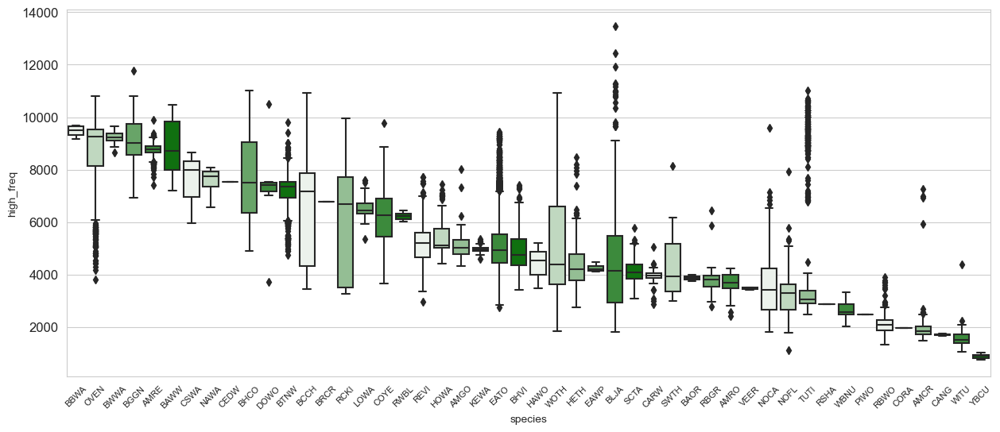

In [3]:
bird_annotation_highfreq_index = bird_annotation[['species', 'high_freq']].groupby('species').agg('median').sort_values(by='high_freq', ascending=False)
bird_annotation_highfreq = bird_annotation[['species', 'high_freq']].set_index('species')
bird_annotation_highfreq = bird_annotation_highfreq.loc[bird_annotation_highfreq_index.index].reset_index()
pal = sns.light_palette("green", as_cmap=False)

# 设置画布大小
plt.figure(figsize=(15, 6))
sns.boxplot(data=bird_annotation_highfreq, x='species', y='high_freq', palette=pal)

# 减小 x 轴标记字体大小
_ = plt.xticks(rotation=45, fontsize=8)
_ = plt.yticks(fontsize=12)
plt.show()


- 对音频重叠程度的描述性统计

    先定量看一下重叠音频片段在总音频片段中的占比：11972/(11972+4080) = 74.6%。即大部分音频都是含有重叠的。

    再定量的看一下音频重叠比<0.1的情况。因为在初步的建模过程中，作者认为音频重叠比<0.1的数据相对而言噪声较小，有利于建立有分辨力的模型。


11972
4080


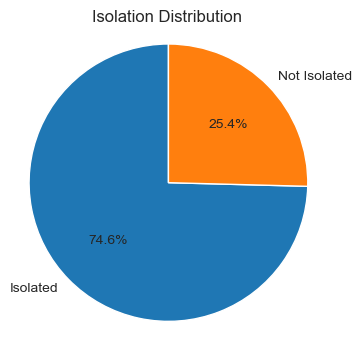

In [4]:
# 计算 is_isolate 列中 True 和 False 的数量
isolate_counts = bird_annotation['is_isolate'].value_counts()
print(bird_annotation[bird_annotation['is_isolate']==False].shape[0])
print(bird_annotation[bird_annotation['is_isolate']==True].shape[0])

# 绘制饼图
plt.figure(figsize=(4, 4))
plt.pie(isolate_counts, labels=['Isolated','Not Isolated'], autopct='%1.1f%%', startangle=90)
plt.title("Isolation Distribution")
plt.axis('equal')  # 使饼图为圆形
plt.show()


当筛选重叠比<0.1的音频片段时，总的音频片段数量从16052(11972+4080)条降到了4762条数据。每条音频的时长平均为0.926秒，标准差为0.577。这是一个符合直觉的观察：纯净的鸟鸣片段较短，与单声鸟叫时长一致。


In [5]:
bird_annotation = bird_annotation[bird_annotation['overlap_percent']<0.1]
bird_annotation.duration.describe()


count    8515.000000
mean        0.970927
std         0.596670
min         0.050765
25%         0.436364
50%         0.981818
75%         1.319963
max         5.688739
Name: duration, dtype: float64

按照鸟类分组，纯净的鸟鸣片段的分布。可以看出鸟鸣片段在各种鸟类中的分布并不均匀，比如EATO这类鸟有很多的纯净鸟鸣片段，且片段时长（纵轴）分布基本集中在0-2s以内，相比而言，SCTA这类鸟的纯净鸟鸣片段较少，且片段时长不均。


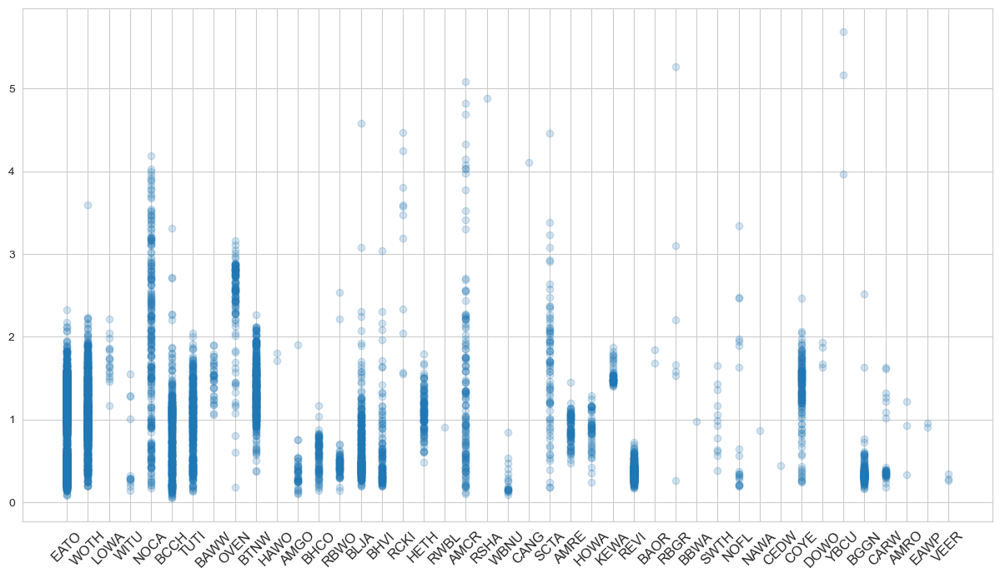

In [6]:
plt.figure(figsize=(15,8))
plt.scatter(data=bird_annotation, x="species", y="duration", alpha=0.2)
_ = plt.xticks(rotation=45, fontsize=12)


由于音频文件中有一部分声音是没有鸟鸣的，这对后续的分类相当于“无效数据”。 我们仅需要在每个 5 分钟的音频文件中提取含有鸟鸣注解的有效部分，即鸟鸣片段。 鸟鸣片段的提取依赖于注解文件中的起讫时间列。从这个角度，可以统计数据集中各 类鸟的鸟鸣片段数与总时长，这有助于了解分类器所处理数据的稀疏程度。

对于不加筛选的大部分鸟鸣片段个数在 0-500 之间，鸟鸣片段总时长也在10-500s 以内，说明不同鸟类数据的稀疏差别较大。鸟鸣片段总时长短、鸟鸣片段个数少的鸟类，会削弱分类器的准确度。

对于筛选过后的鸟鸣片段，可以看出鸟类的音频的个数与音频总长基本成正比，说明鸟鸣的单个片段时长基本差不多。


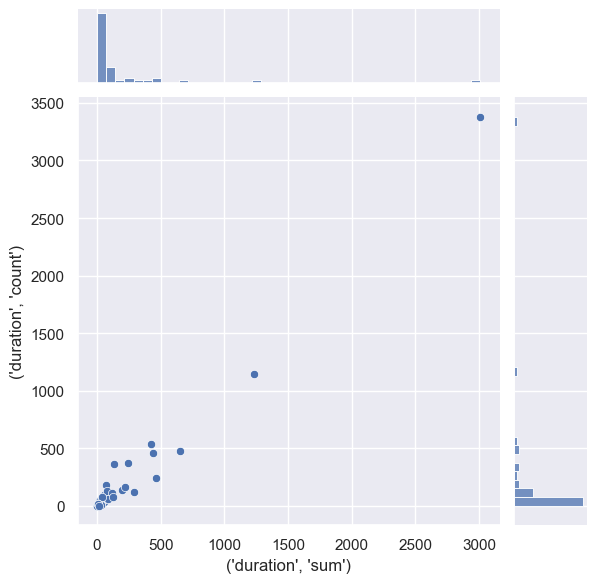

In [7]:
bird_annotation_species_duration = bird_annotation[['species','duration']].groupby('species').agg(['count','sum'])
sns.set(rc={'figure.figsize':(15,15)})
sns.jointplot(data=bird_annotation_species_duration, x=('duration','sum'), y=('duration','count'))


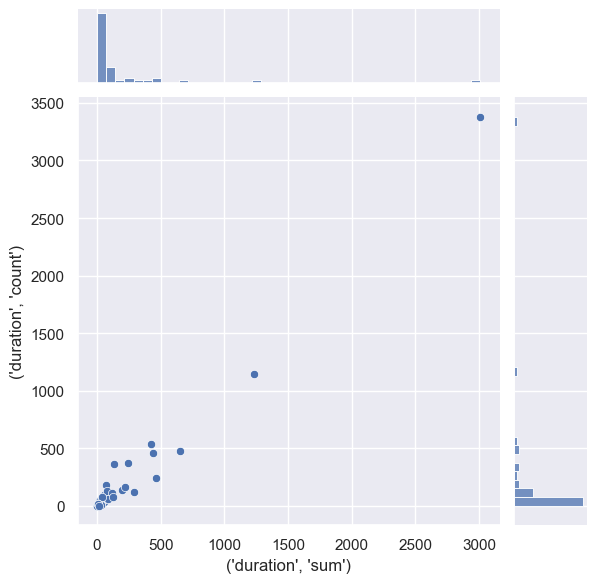

In [8]:
bird_annotation_pure= bird_annotation[bird_annotation['overlap_percent']<0.1]
bird_annotation_pure_species_duration = bird_annotation_pure[['species','duration']].groupby('species').agg(['count','sum'])
sns.set(rc={'figure.figsize':(15,15)})
sns.jointplot(data=bird_annotation_pure_species_duration, x=('duration','sum'), y=('duration','count'))


# 3. 对音频文件的描述性统计

对于音频文件对应的注解来说，每份音频文件时长为 5 分钟，含有各种鸟的叫声的注解。其中有三个主要的信息：1.鸟鸣的种类 2. 注解的数量 3.采集日期。

以鸟类为分组，查看注解数量与采集日期的关系。
一般在野外观鸟的时候，观鸟的日期和地点是非常重要的线索。但是在机器学习的模型中，这一点往往因为不属于音频特征的范围而被排除在外。
按照采样日期和鸟类，对音频片段的数目进行统计，可以发现在 6/16 日采集的音频中，多出了 7 种鸟类。经过查阅资料，确认这 7 种鸟皆属于候鸟，即在冬日会迁徙往美国南部过冬。
因此，本文将采集日期 date 纳入自变量的范围。这一变量对分类结果影响的讨论，具体见本文第四部分。


In [9]:
bird_annotation_species_recording= bird_annotation[['species','recording']]
bird_annotation_species_recording['recording_day'] = bird_annotation_species_recording['recording'].apply(lambda elem: elem.split('_Segment')[0])
grouped_bird_annotation_species_recording = bird_annotation_species_recording.groupby(['species','recording_day']).size()
grouped_bird_annotation_species_recording = pd.DataFrame(grouped_bird_annotation_species_recording).reset_index().rename(columns={0:'Count'})
grouped_bird_annotation_species_recording = grouped_bird_annotation_species_recording.sort_values(by='recording_day')
grouped_bird_annotation_species_recording


/var/folders/t9/j3ypfz7s4s94bsrqf7kf4b9h0000gn/T/ipykernel_6111/3966590505.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bird_annotation_species_recording['recording_day'] = bird_annotation_species_recording['recording'].apply(lambda elem: elem.split('_Segment')[0])


,species,recording_day,Count
0,AMCR,Recording_1,60
25,BTNW,Recording_1,442
27,CANG,Recording_1,1
33,EATO,Recording_1,1188
39,HETH,Recording_1,111
...,...,...,...
10,BAWW,Recording_4,3
48,NOCA,Recording_4,179
50,NOFL,Recording_4,17
36,EATO,Recording_4,1969


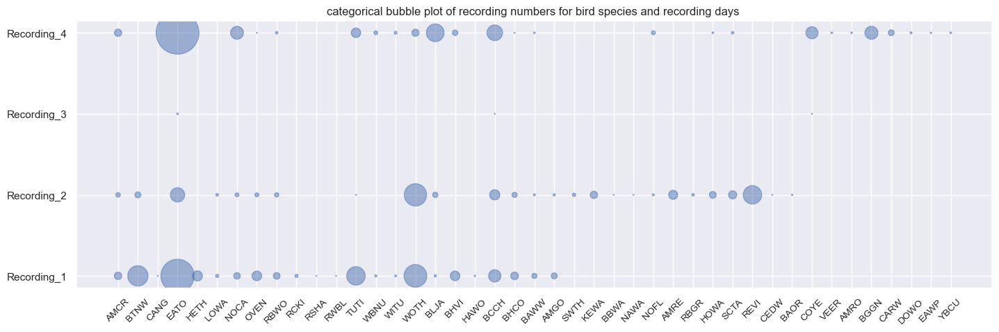

In [10]:
plt.figure(figsize=(17,5))
plt.scatter(x='species',y='recording_day',s='Count', data=grouped_bird_annotation_species_recording,alpha=0.5)
_ = plt.xticks(rotation=45, fontsize=10)
_ = plt.title('categorical bubble plot of recording numbers for bird species and recording days ')


In [11]:
bird_annotation_pure = bird_annotation[bird_annotation['overlap_percent']<0.1]
ann_per_recording = bird_annotation_pure.groupby(['recording']).agg(['count'])[('selection','count')]
sp_per_recording = bird_annotation_pure.groupby(['recording']).agg({'species':pd.Series.nunique})
meta_bird_annotation_pure = pd.concat([sp_per_recording,ann_per_recording], axis=1)
meta_bird_annotation_pure['avg annotation per species'] = round(meta_bird_annotation_pure[('selection', 'count')]/meta_bird_annotation_pure['species'],2)
meta_bird_annotation_pure.sort_values(by='avg annotation per species', ascending=False)


,species,"(selection, count)",avg annotation per species
recording,,,
Recording_4_Segment_02,3,181,60.33
Recording_1_Segment_04,3,136,45.33
Recording_1_Segment_03,1,44,44.00
Recording_2_Segment_01,4,145,36.25
Recording_4_Segment_04,5,175,35.00
...,...,...,...
Recording_1_Segment_26,8,52,6.50
Recording_2_Segment_13,12,78,6.50
Recording_1_Segment_02,1,6,6.00


# 4.信号特征


通过librosa.load读取音频文件，通过ipd.Audio在notebook中播放。Fs为音频采样频率。

In [12]:
r1, Fs = librosa.load('./dryad/wav_Files/Recording_1/Recording_1_Segment_09.wav')
ipd.Audio(r1, rate=Fs)

通过annotation文件对每分音频文件切割，下面选取了一段较为纯净的鸟鸣片段。

In [13]:
FILE_PATH  = './dryad/annotation_Files/Recording_1/Recording_1_Segment_09.Table.1.selections.txt'
r1_annotation = get_simplified_annotation(FILE_PATH)
r1 = get_segment(signal=r1, annotation=r1_annotation,Fs=Fs)
r1_39 = r1[39]
ipd.Audio(r1_39, rate=Fs)

音频的时间-响度图(Oscillogram)

Text(0, 0.5, 'Amplitude')

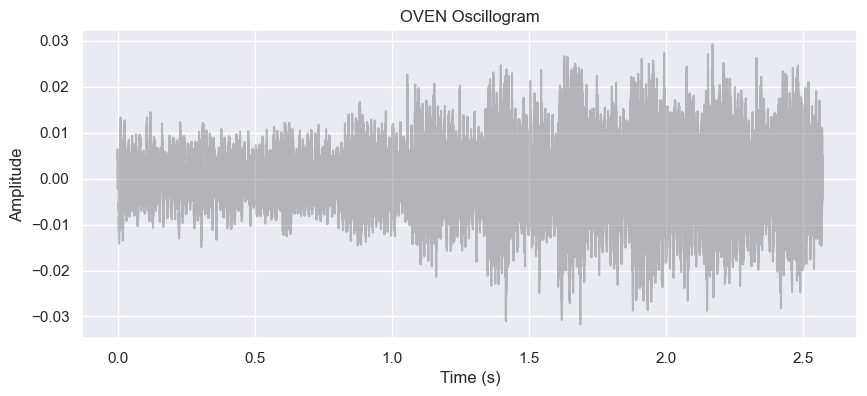

In [14]:
r1_39_arrary = np.arange(0, len(r1_39) / Fs, 1 / Fs)
plt.figure(figsize=(10, 4))
plt.plot(r1_39_arrary, r1_39, color='grey', alpha=0.5)
plt.title('OVEN Oscillogram')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

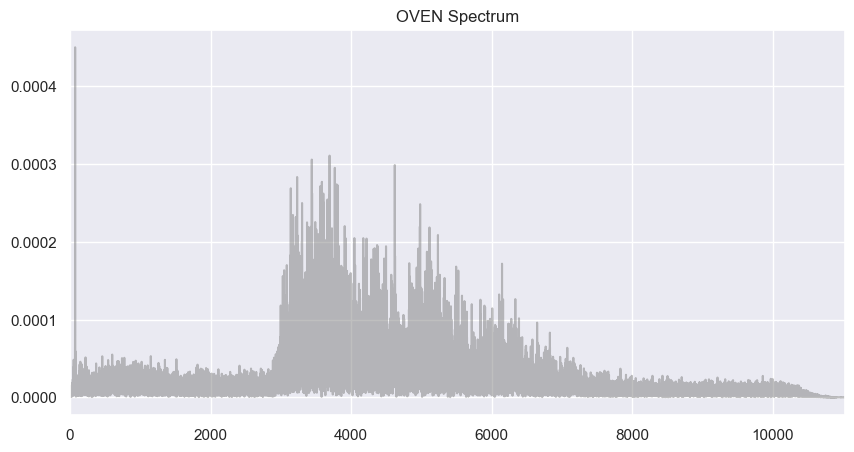

In [15]:
from utils.signal import filter_signal
r1_39_filtered = filter_signal(r1_39,Fs,500)
plot_spectra(r1_39_filtered,Fs, 'OVEN Spectrum')

时频图。其中灰度表示频段（纵轴）的能量强度，横轴为时间。

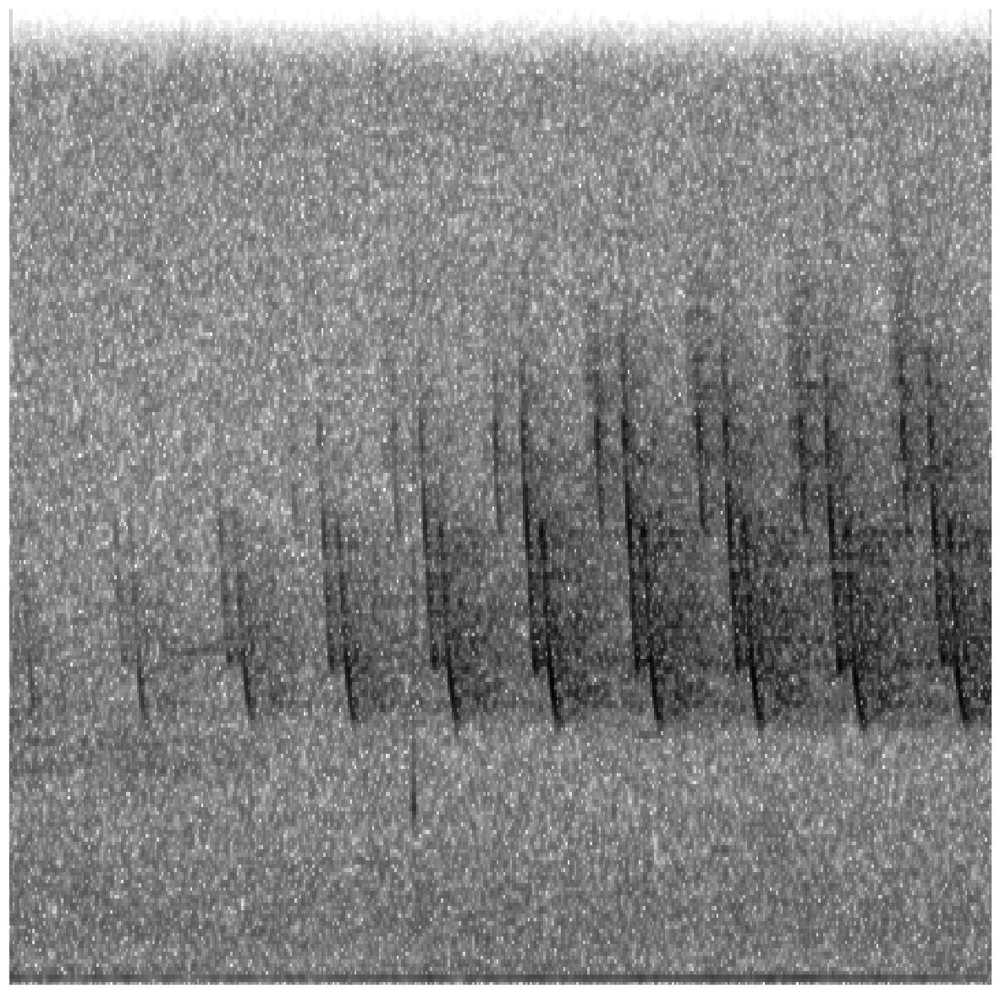

In [17]:
librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(r1_39_filtered, n_fft=512, hop_length=128))),cmap='Greys')

MFCC系数，一个常用的ML信号特征

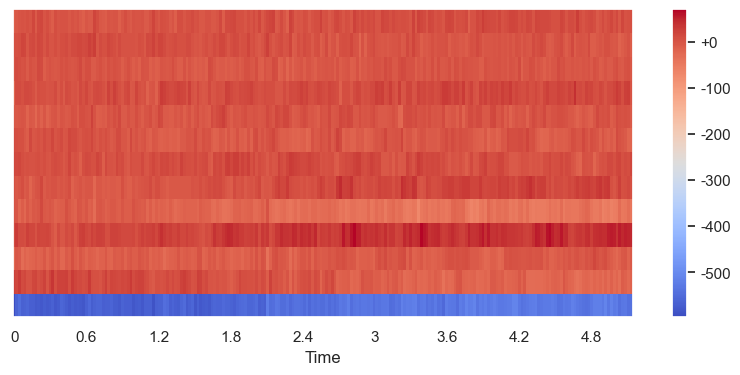

array([[-5.97741800e+02, -5.62141670e+02, -5.46824429e+02, ...,
        -5.27680990e+02, -5.42312435e+02, -5.38059395e+02],
       [ 2.66649721e+01,  1.71671308e+01,  3.11035540e+01, ...,
        -1.25962070e+01, -2.41758135e+01, -1.66994158e+01],
       [-2.46434611e+01,  3.36288042e-01, -6.24466703e+00, ...,
        -1.15155792e+00, -1.65164274e+01, -5.49855083e+00],
       ...,
       [ 3.13973161e+00,  1.38977491e+01,  9.81756136e+00, ...,
         3.89448169e+00,  7.96097605e+00, -4.31605756e+00],
       [ 6.44581936e+00,  7.60918666e+00,  9.00011320e+00, ...,
        -4.16986093e+00,  4.81448797e+00, -7.63711534e+00],
       [-1.05982794e+01, -3.86094375e+00,  9.19694530e-01, ...,
         3.79901992e+00,  6.44244280e+00,  7.72121203e+00]])

In [18]:
calc_mfcc(r1_39_filtered, Fs, d=0, frame_length=512, hop_length=256)
